# Alkım Ege Akarsu | 21901461 | CS 484 | HW3

## Package Imports

In [1]:
from copy import deepcopy
from pathlib import Path
from scipy.io import loadmat

import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

SEED = 1337

## Preperation

### Load data

In [2]:
# Get dir of mat file
mat_file_dir = Path().resolve().joinpath("variables.mat")
# Load variables from MATLAB
mat_contents = loadmat(mat_file_dir)
img_labels = mat_contents["img_labels"].flatten()
img_gabors = mat_contents["img_gabors"].flatten()

# Load images
imgs = np.empty((img_labels.shape[0],), dtype=np.ndarray)
for i in range(imgs.shape[0]):
    imgs[i] = plt.imread(Path().resolve().joinpath(f"{i+1}.jpg"))

### Display superpixels

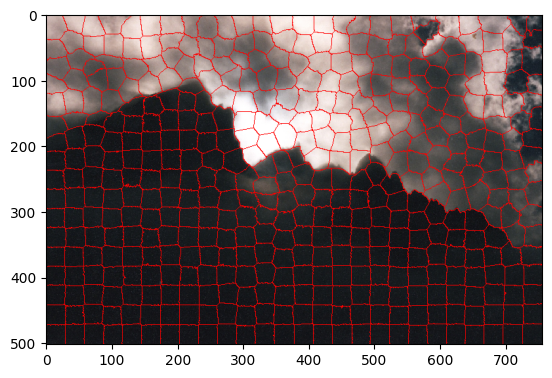

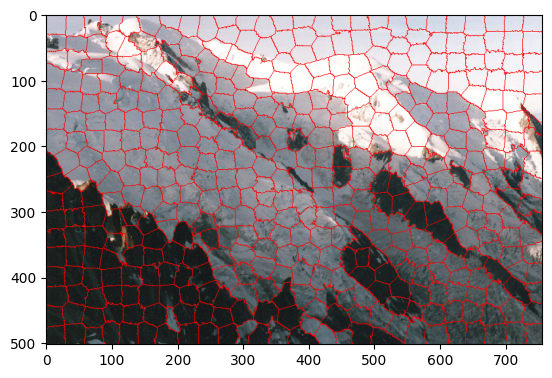

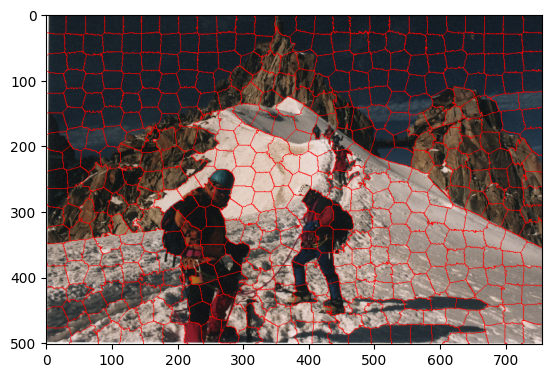

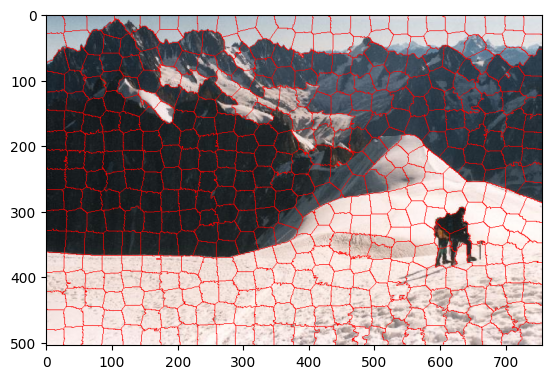

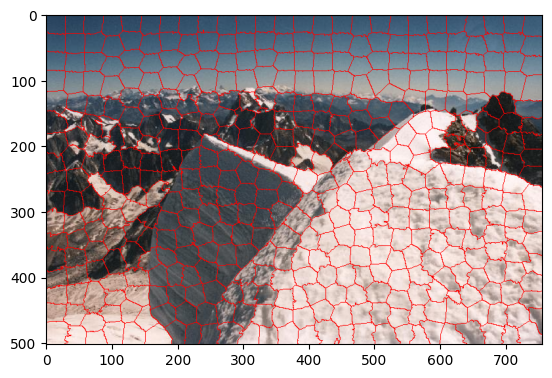

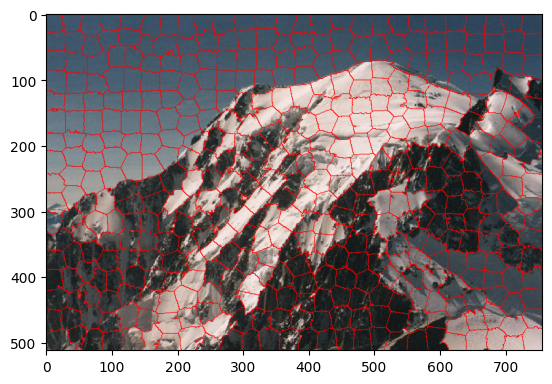

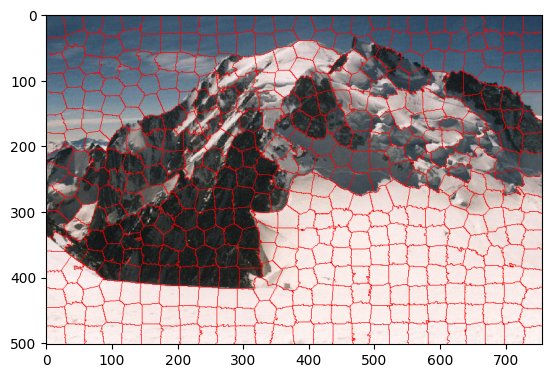

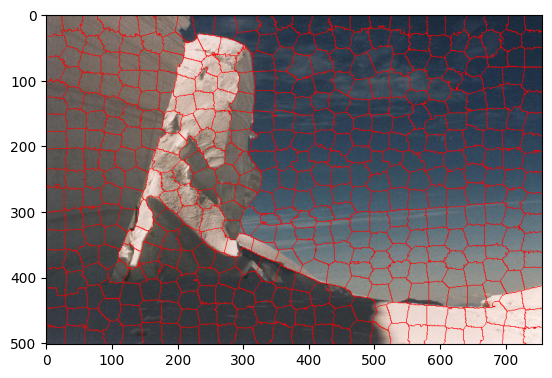

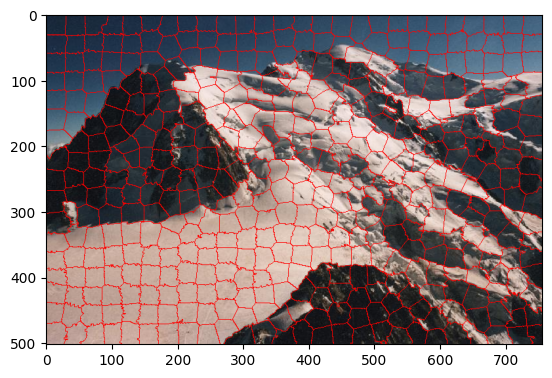

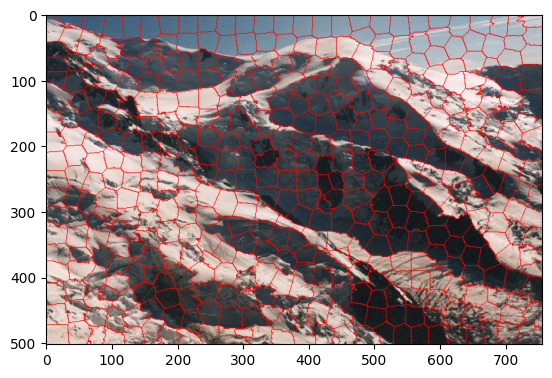

In [3]:
# Prepare storage
imgs_with_sps = deepcopy(imgs)
# Boundary color
boundary_color = np.array([255, 0, 0])

# Draw superpixel boundaries
# Loop over images
for i in range(imgs.shape[0]):
    # Loop over pixels
    # Loop over columns
    for y in range(imgs[i].shape[0]):
        # Set previous pixel label as the first pixel in the column
        previous_pixel_label = img_labels[i][y, 0]
        # Loop over rows
        for x in range(imgs[i].shape[1]):
            # Change value of pixel if on boundary
            if previous_pixel_label != img_labels[i][y, x]:
                imgs_with_sps[i][y, x] = boundary_color
            # Update previous pixel label
            previous_pixel_label = img_labels[i][y, x]
    # Loop over rows
    for x in range(imgs[i].shape[1]):
        # Set previous pixel label as the first pixel in the column
        previous_pixel_label = img_labels[i][0, x]
        # Loop over columns
        for y in range(imgs[i].shape[0]):
            # Change value of pixel if on boundary
            if previous_pixel_label != img_labels[i][y, x]:
                imgs_with_sps[i][y, x] = boundary_color
            # Update previous pixel label
            previous_pixel_label = img_labels[i][y, x]

# Display and save images
for i, image in enumerate(imgs_with_sps):
    plt.figure()
    plt.imshow(image)
    plt.show()
    plt.imsave(Path().resolve().joinpath(f"{i+1}_superpixels.jpg"), image)

## Part 2

In [4]:
# GET GABORS OF SUPERPIXELS
# Prepare storage
img_sp_gabors = np.empty((img_labels.shape[0],), dtype=np.ndarray)
for i in range(img_sp_gabors.shape[0]):
    img_sp_gabors[i] = np.zeros((np.unique(img_labels[i]).shape[0], img_gabors[i].shape[2]))
# Loop over images
for i in range(img_labels.shape[0]):
    print(f"Image {i+1} of {img_labels.shape[0]}")
    # Loop over gabor layers
    for j in range(img_gabors[i].shape[2]):
        # Data to calculate avg
        gabor_total_per_sp = np.zeros((np.unique(img_labels[i]).shape[0],))
        num_pixel_per_sp = np.zeros_like(gabor_total_per_sp)
        # Loop over pixels
        for y in range(img_labels[i].shape[0]):
            for x in range(img_labels[i].shape[1]):
                # Update total and num
                gabor_total_per_sp[img_labels[i][y, x]] += img_gabors[i][y, x, j]
                num_pixel_per_sp[img_labels[i][y, x]] += 1
        # Get avg
        img_sp_gabors[i][:,j] = gabor_total_per_sp / num_pixel_per_sp

Image 1 of 10
Image 2 of 10
Image 3 of 10
Image 4 of 10
Image 5 of 10
Image 6 of 10
Image 7 of 10
Image 8 of 10
Image 9 of 10
Image 10 of 10


## Part 3

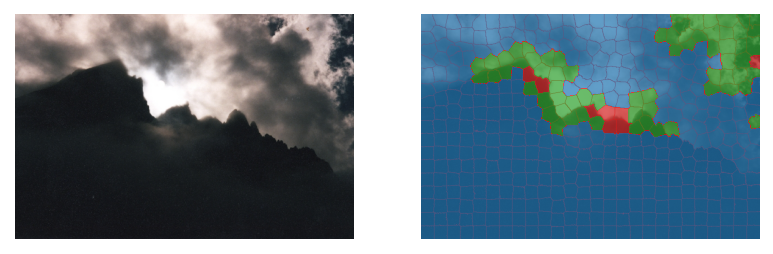

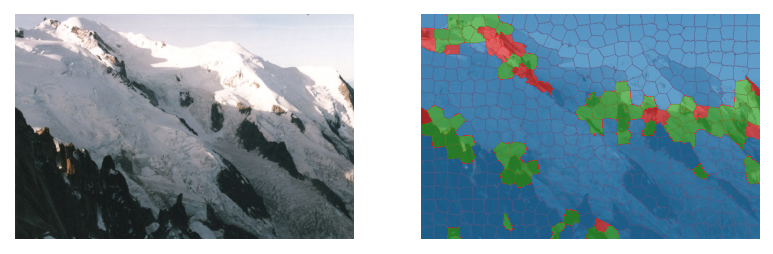

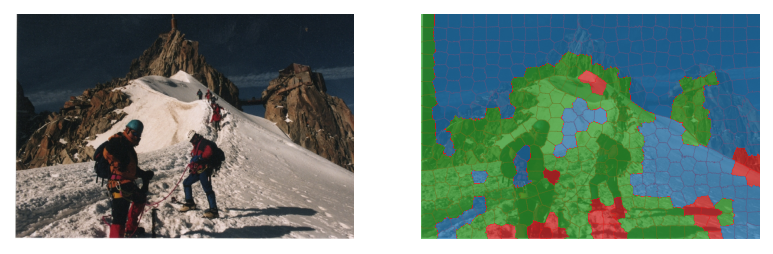

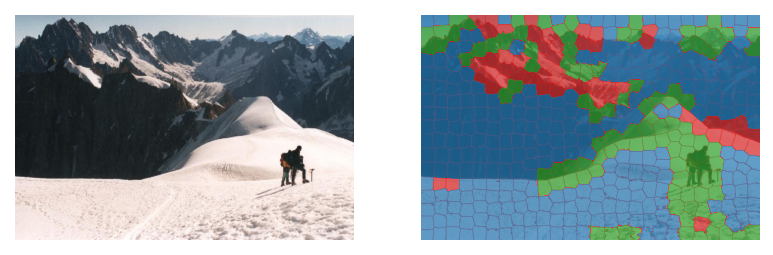

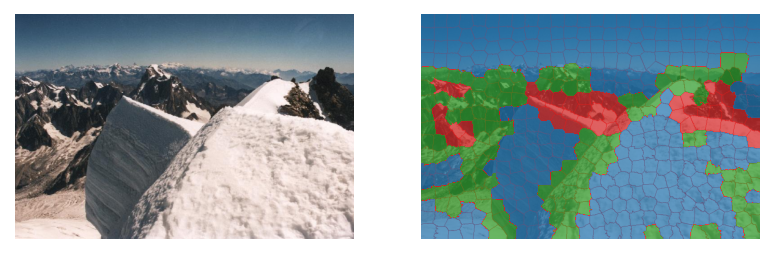

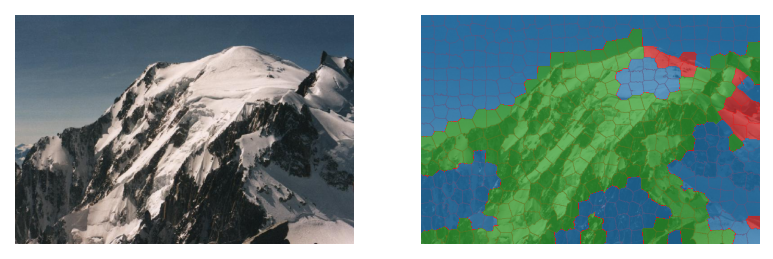

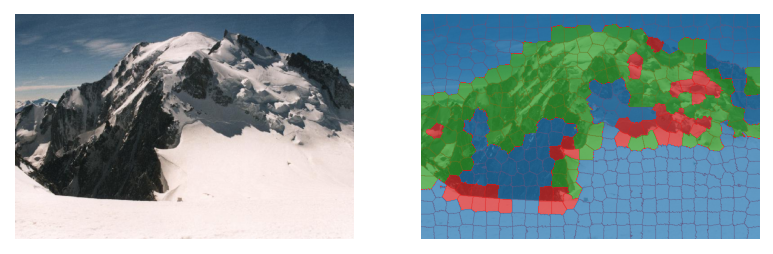

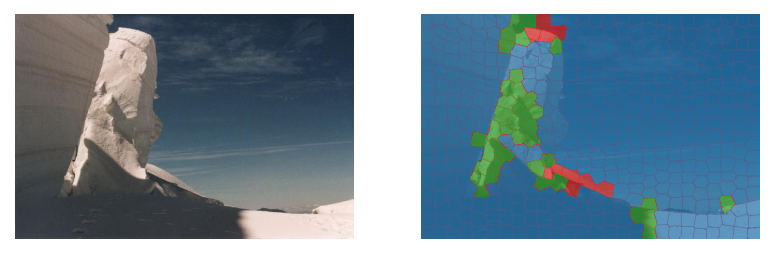

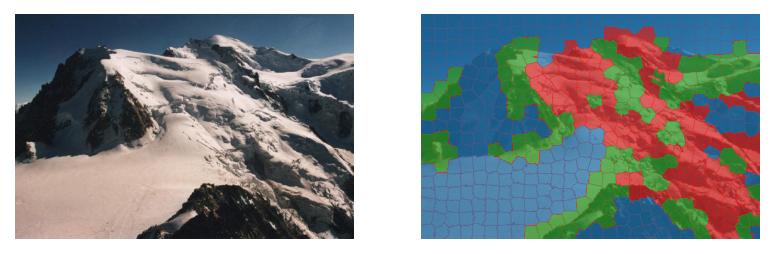

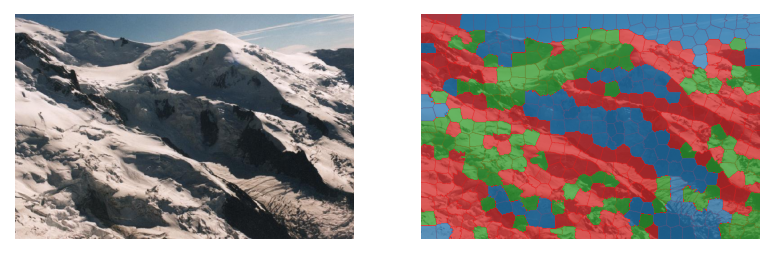

In [8]:
# Append gabors of all images
img_sp_gabors_all = np.zeros((np.unique(img_labels[0]).shape[0] * img_labels.shape[0], img_gabors[0].shape[2]))
for i in range(img_labels.shape[0]):
    img_sp_gabors_all[i*img_sp_gabors[0].shape[0]:(i+1)*img_sp_gabors[0].shape[0], :] = img_sp_gabors[i]

# Clustering
img_sp_gabors_all_cluster_labels = KMeans(n_clusters=3,
                                          init="random",
                                          n_init=20,
                                          random_state=SEED).fit_predict(img_sp_gabors_all)
# Seperate back into images
# Prepare storage
img_sp_cluster_labels = np.empty((img_labels.shape[0],), dtype=np.ndarray)
for i in range(img_sp_cluster_labels.shape[0]):
    img_sp_cluster_labels[i] = np.zeros((np.unique(img_labels[i]).shape[0],))
# Fill storage
for i in range(img_labels.shape[0]):
    img_sp_cluster_labels[i] = img_sp_gabors_all_cluster_labels[i*img_sp_gabors[0].shape[0]:(i+1)*img_sp_gabors[0].shape[0]]

# PSEUDO COLOR IMAGES
# Prepare images
img_cluster_labels = deepcopy(img_labels)
# Fill images
# Loop over images
for i in range(img_cluster_labels.shape[0]):
    # Loop over pixels
    for y in range(img_cluster_labels[i].shape[0]):
        for x in range(img_cluster_labels[i].shape[1]):
            # Change value to corresponding clustering label
            img_cluster_labels[i][y, x] = img_sp_cluster_labels[i][img_labels[i][y, x]]

# Display images
# Display all psudocolor images
for i in range(img_cluster_labels.shape[0]):
    plt.figure(dpi=150)
    plt.subplot(1, 2, 1)
    plt.imshow(imgs[i])
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(img_cluster_labels[i], cmap=ListedColormap(["tab:green", "tab:red", "tab:blue"]))
    plt.imshow(imgs_with_sps[i], alpha=0.3)
    plt.axis("off")
    plt.show()

## Part 4

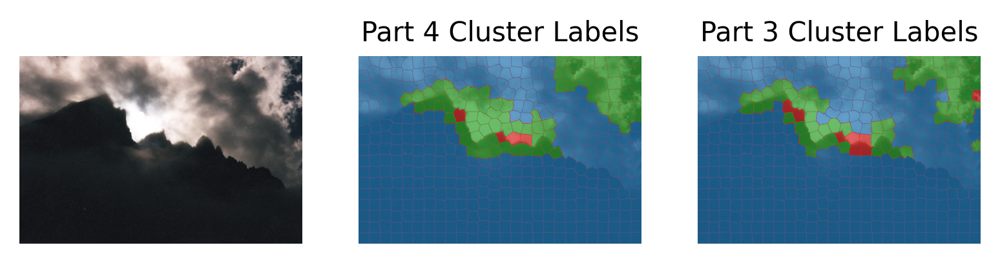

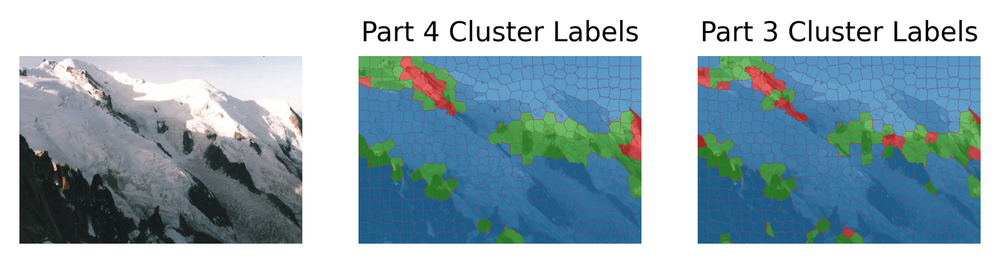

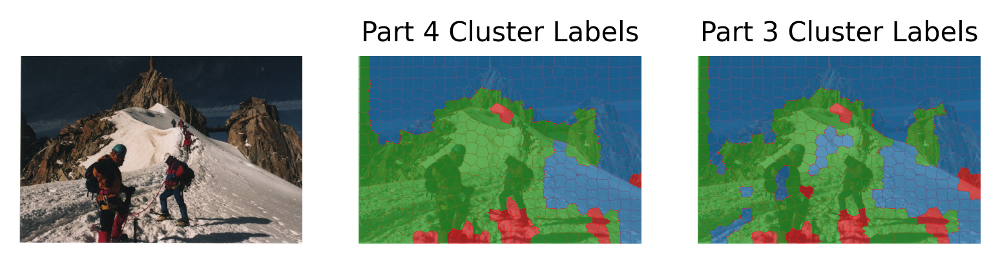

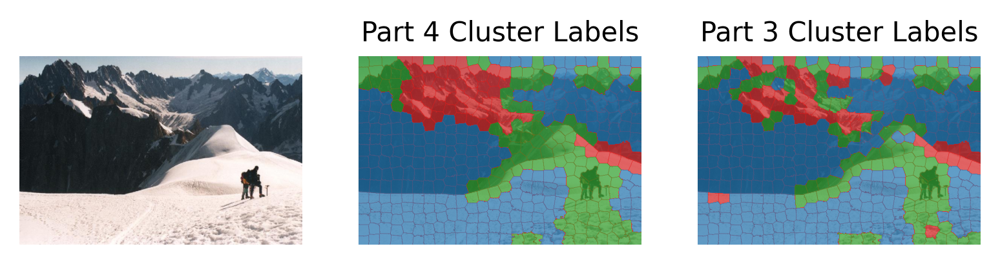

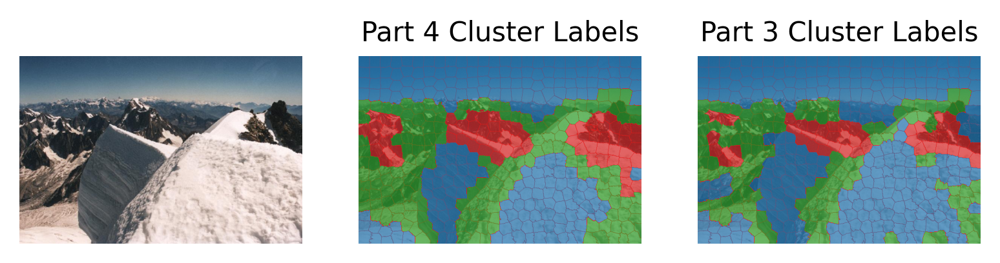

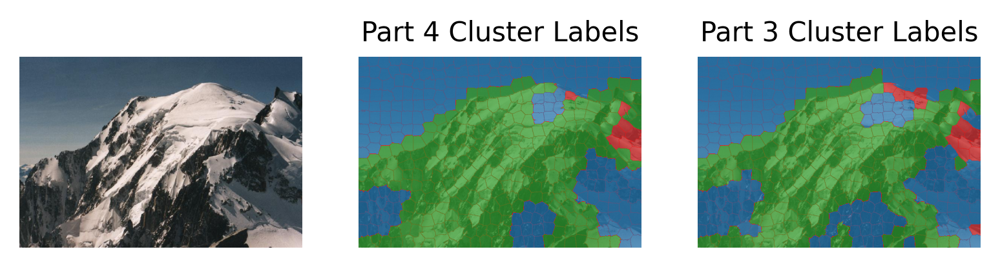

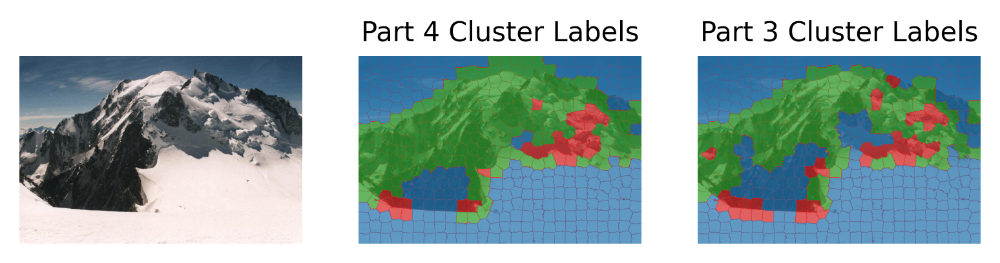

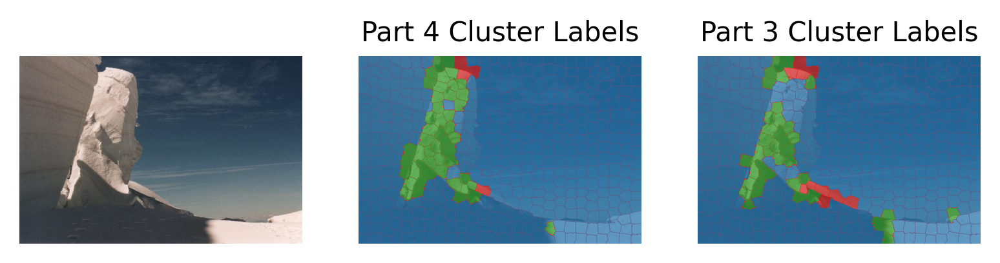

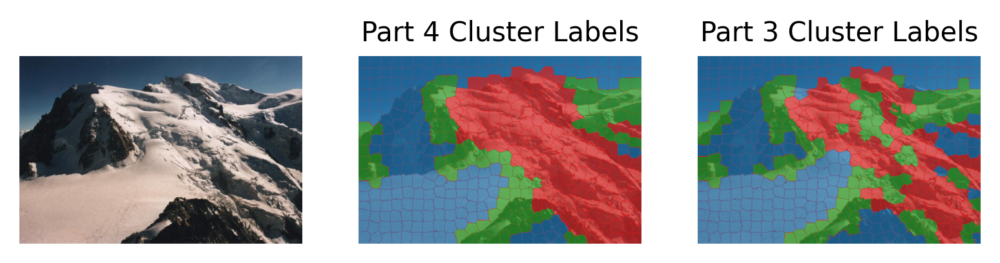

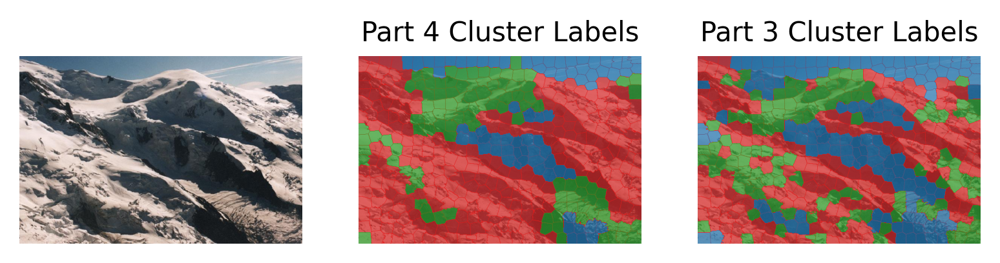

In [12]:
# Get centroid indexes
# Centroid storage
img_sp_centroids = np.empty((img_labels.shape[0],), dtype=np.ndarray)
for i in range(img_sp_centroids.shape[0]):
    img_sp_centroids[i] = np.empty((np.unique(img_labels[i]).shape[0],), dtype=np.ndarray)
# Loop over images
for i in range(img_labels.shape[0]):
    # Get the unique labels in the current image
    unique_labels = np.unique(img_labels[i])
    # Loop over each unique label (superpixel)
    for label in unique_labels:
        # Get the indexes of the current label
        indexes = np.where(img_labels[i] == label)
        # Calculate the centroid
        centroid = np.mean(indexes, axis=1)
        # Append the centroid to the list
        img_sp_centroids[i][label] = centroid

# Get superpixel diameters
# Superpixel diameter storage
img_sp_diameters = np.empty((img_labels.shape[0],), dtype=np.ndarray)
for i in range(img_sp_diameters.shape[0]):
    img_sp_diameters[i] = np.zeros((np.unique(img_labels[i]).shape[0],))
# Loop over images
for i in range(img_labels.shape[0]):
    # Get the unique labels in the current image
    unique_labels = np.unique(img_labels[i])
    # Loop over each unique label (superpixel)
    for label in unique_labels:
        # Get the indexes of the current label
        indexes = np.where(img_labels[i] == label)
        # Calculate the distances from the centroid to all points in the superpixel
        distances = np.sqrt(np.sum((indexes - img_sp_centroids[i][label].reshape(2, -1))**2, axis=0))
        # The diameter is twice the maximum distance
        diameter = 2 * np.max(distances)
        # Store the diameter
        img_sp_diameters[i][label] = diameter

# Get lvl1 and lvl2 neighbors
# lvl1 neighbor storage
img_sp_lvl1_neighbors = np.empty((img_labels.shape[0],), dtype=np.ndarray)
for i in range(img_sp_lvl1_neighbors.shape[0]):
    img_sp_lvl1_neighbors[i] = np.empty((np.unique(img_labels[i]).shape[0],), dtype=np.ndarray)
# lvl2 neighbor storage
img_sp_lvl2_neighbors = np.empty((img_labels.shape[0],), dtype=np.ndarray)
for i in range(img_sp_lvl2_neighbors.shape[0]):
    img_sp_lvl2_neighbors[i] = np.empty((np.unique(img_labels[i]).shape[0],), dtype=np.ndarray)
# Loop over images
for i in range(img_labels.shape[0]):
    # Get the unique labels in the current image
    unique_labels = np.unique(img_labels[i])
    # Loop over each unique label (superpixel)
    for label in unique_labels:
        # Initialize empty lists to store the neighbors
        neighbors_1 = []
        neighbors_2 = []
        # Loop over each unique label again to compare with the current superpixel
        for other_label in unique_labels:
            # Skip if it's the same superpixel
            if label == other_label:
                continue
            # Calculate the distance between the centroids
            distance = np.sqrt(np.sum((img_sp_centroids[i][label] - img_sp_centroids[i][other_label])**2))
            # lvl1 neighbors
            if distance <= 1.5 * img_sp_diameters[i][label]:
                neighbors_1.append(other_label)
            elif distance <= 2.5 * img_sp_diameters[i][label]:
                neighbors_2.append(other_label)
        # Store the neighbors
        img_sp_lvl1_neighbors[i][label] = np.array(neighbors_1)
        img_sp_lvl2_neighbors[i][label] = np.array(neighbors_2)

# Get lvl1 and lvl2 avg feature vectors
# lvl1 avg storage
img_sp_lvl1_avg = deepcopy(img_sp_gabors)
# lvl2 avg storage
img_sp_lvl2_avg = deepcopy(img_sp_gabors)
# Loop over images
for i in range(img_sp_lvl1_neighbors.shape[0]):
    # Loop over labels
    for j in range(img_sp_lvl1_neighbors[i].shape[0]):
        # Get lvl1 avg
        img_sp_lvl1_avg[i][j, :] = np.mean(img_sp_gabors[i][img_sp_lvl1_neighbors[i][j], :], axis=0)
        # Get lvl2 avg
        img_sp_lvl2_avg[i][j, :] = np.mean(img_sp_gabors[i][img_sp_lvl2_neighbors[i][j], :], axis=0)

# Concatenate original sp features with lvl1 and lvl2 avg
img_sp_final_features = np.empty((img_sp_gabors.shape[0],), dtype=np.ndarray)
# Loop over images
for i in range(img_sp_gabors.shape[0]):
    # Concatenate all features
    img_sp_final_features[i] = np.concatenate((img_sp_gabors[i], img_sp_lvl1_avg[i], img_sp_lvl2_avg[i]), axis=1)

# Append gabors of all images
img_sp_final_features_all = np.zeros((np.unique(img_labels[0]).shape[0] * img_labels.shape[0], img_sp_final_features[0].shape[1]))
for i in range(img_labels.shape[0]):
    img_sp_final_features_all[i*img_sp_final_features[0].shape[0]:(i+1)*img_sp_final_features[0].shape[0], :] = img_sp_final_features[i]

# Clustering
img_sp_final_features_all_cluster_labels = KMeans(n_clusters=3,
                                                  init="random",
                                                  n_init=20,
                                                  random_state=SEED).fit_predict(img_sp_final_features_all)
# Seperate back into images
# Prepare storage
img_sp_final_cluster_labels = np.empty((img_labels.shape[0],), dtype=np.ndarray)
for i in range(img_sp_final_cluster_labels.shape[0]):
    img_sp_final_cluster_labels[i] = np.zeros((np.unique(img_labels[i]).shape[0],))
# Fill storage
for i in range(img_labels.shape[0]):
    img_sp_final_cluster_labels[i] = img_sp_final_features_all_cluster_labels[i*img_sp_final_features[0].shape[0]:(i+1)*img_sp_final_features[0].shape[0]]

# PSEUDO COLOR IMAGES
# Prepare images
img_final_cluster_labels = deepcopy(img_labels)
# Fill images
# Loop over images
for i in range(img_final_cluster_labels.shape[0]):
    # Loop over pixels
    for y in range(img_final_cluster_labels[i].shape[0]):
        for x in range(img_final_cluster_labels[i].shape[1]):
            # Change value to corresponding clustering label
            img_final_cluster_labels[i][y, x] = img_sp_final_cluster_labels[i][img_labels[i][y, x]]

# Display images
# Display all psudocolor images
for i in range(img_final_cluster_labels.shape[0]):
    plt.figure(dpi=300)
    plt.subplot(1, 3, 1)
    plt.imshow(imgs[i])
    plt.axis("off")
    plt.subplot(1, 3, 2)
    plt.title("Part 4 Cluster Labels", fontsize=10)
    plt.imshow(img_final_cluster_labels[i], cmap=ListedColormap(["tab:green", "tab:red", "tab:blue"]))
    plt.imshow(imgs_with_sps[i], alpha=0.3)
    plt.axis("off")
    plt.subplot(1, 3, 3)
    plt.title("Part 3 Cluster Labels", fontsize=10)
    plt.imshow(img_cluster_labels[i], cmap=ListedColormap(["tab:green", "tab:red", "tab:blue"]))
    plt.imshow(imgs_with_sps[i], alpha=0.3)
    plt.axis("off")
    plt.show()